# Assignment 2: Image Enhancement (về nhà)
Tổng quan: Ở bài tập này, chúng ta sẽ thực hành lập trình tìm ra các vùng solar panel hình chữ nhật
Yêu cầu thư viện: OpenCV 3.3, matplotlib, scikit-learn
## Các bạn điền vào phần code còn bỏ trống

In [2]:
from __future__ import division
from matplotlib import style
import cv2
import os 
import numpy as np
import matplotlib.pyplot as plt
import pickle
import sklearn
import scipy.stats
from IPython.display import Image
style.use('dark_background')

In [3]:
def canny_edge_detection(img, blur_ksize, threshold1, threshold2, skipping_threshold):
    img_gaussian = cv2.GaussianBlur(img,(blur_ksize,blur_ksize),0)
    plt.imshow(img_gaussian)
    plt.show()
    img_canny = cv2.Canny(img_gaussian,threshold1,threshold2)
    return img_canny

In [4]:
# Functions to find the distance between 2 segments
def segments_distance(u,v):
    """ 
    distance between two segments in the plane:
    one segment is (x11, y11) to (x12, y12)
    the other is   (x21, y21) to (x22, y22)
    """
    x11=u[0]
    y11=u[1]
    x12=u[2]
    y12=u[3]
    x21=v[0]
    y21=v[1]
    x22=v[2]
    y22=v[3]
    if segments_intersect(x11, y11, x12, y12, x21, y21, x22, y22): return 0
  # try each of the 4 vertices w/the other segment
    distances = []
    distances.append(point_segment_distance(x11, y11, x21, y21, x22, y22))
    distances.append(point_segment_distance(x12, y12, x21, y21, x22, y22))
    distances.append(point_segment_distance(x21, y21, x11, y11, x12, y12))
    distances.append(point_segment_distance(x22, y22, x11, y11, x12, y12))
    return min(distances)

def segments_intersect(x11, y11, x12, y12, x21, y21, x22, y22):
    """ 
    whether two segments in the plane intersect:
    one segment is (x11, y11) to (x12, y12)
    the other is   (x21, y21) to (x22, y22)
    """
    dx1 = x12 - x11
    dy1 = y12 - y11
    dx2 = x22 - x21
    dy2 = y22 - y21
    delta = dx2 * dy1 - dy2 * dx1
    if delta == 0: return False  # parallel segments
    s = (dx1 * (y21 - y11) + dy1 * (x11 - x21)) / delta
    t = (dx2 * (y11 - y21) + dy2 * (x21 - x11)) / (-delta)
    return (0 <= s <= 1) and (0 <= t <= 1)

import math
def point_segment_distance(px, py, x1, y1, x2, y2):
    dx = x2 - x1
    dy = y2 - y1
    if dx == dy == 0:  # the segment's just a point
        return math.hypot(px - x1, py - y1)

  # Calculate the t that minimizes the distance.
    t = ((px - x1) * dx + (py - y1) * dy) / (dx * dx + dy * dy)

  # See if this represents one of the segment's
  # end points or a point in the middle.
    if t < 0:
        dx = px - x1
        dy = py - y1
    elif t > 1:
        dx = px - x2
        dy = py - y2
    else:
        near_x = x1 + t * dx
        near_y = y1 + t * dy
        dx = px - near_x
        dy = py - near_y
    return math.hypot(dx, dy)

In [5]:
# Function to find the cartesian form for line equation.
def carte(rho, theta):
    if theta == 0:
        a=0
        b=rho/(math.cos(theta))
    else:
        b=rho/(math.cos(theta))
        a=(math.sin(theta)/math.cos(theta))
#         print(rho,theta/(math.pi/180),math.cos(theta),math.sin(theta))
    return a,b

In [6]:
# Find rho and theta from a line given 2 points
def rho_theta(x1,y1,x2,y2):
    if x1-x2!=0:
        m = (y2-y1)/(x2-x1)
        theta = math.atan(m)
        rho = (abs(y1-m*x1)/(m**2+1)**0.5)
    return rho,theta

In [7]:
# Find cross points between lines
from __future__ import division 
def line(p):
    A = (p[1] - p[3])
    B = (p[2] - p[0])
    C = (p[0]*p[3] - p[2]*p[1])
    return A, B, -C

def intersection(L1, L2):
    D  = L1[0] * L2[1] - L1[1] * L2[0]
    Dx = L1[2] * L2[1] - L1[1] * L2[2]
    Dy = L1[0] * L2[2] - L1[2] * L2[0]
    if D != 0:
        x = Dx / D
        y = Dy / D
        return x,y
    else:
        return False

In [12]:
def solarPanelDetection(img):
    """
    Horizontal lines.
    """
    """
    1.Post processing.
    """
    kernel = np.ones((5,5), np.uint8) 
    dilation = cv2.dilate(img,kernel,iterations = 1)
    erosion = cv2.erode(img, kernel, iterations=1) 
    img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    img_blur = cv2.medianBlur(img_gray,7,0)
    binary = cv2.adaptiveThreshold(img_blur,255,cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
    cv2.THRESH_BINARY,13,9)
    img_canny = canny_edge_detection(binary, 1, 100, 200, 30)
    """
    2.Apply HoughlinesP for lines detection.
    """
    lines = cv2.HoughLinesP(img_canny,rho=1,theta=np.pi/180,threshold=30,minLineLength=150,maxLineGap=45)
    horizontal_lines = np.empty((0,4)) 
    img_horizontal = img.copy()
    for line in lines:
        for x1,y1,x2,y2 in line:
            if y1-y2<=9 and y1-y2>=-9:
                cv2.line(img_horizontal,(x1,y1),(x2,y2),(0,0,255),1)
                horizontal_lines = np.append(horizontal_lines,[[x1,y1,x2,y2]],axis=0)
    """
    3.Apply Hierarchical clustering for lines clustering.
    """
    X=np.empty((0,4))
    for x1,y1,x2,y2 in horizontal_lines:
        X=np.append(X,[[x1,y1,x2,y2]],axis=0)
    from scipy.cluster.hierarchy import dendrogram, linkage
    from scipy.spatial.distance import pdist, squareform
    from sklearn.cluster import AgglomerativeClustering
    # print(sklearn.__version__)
    hor_dis_matrix = pdist(X,segments_distance)
#     print(hor_dis_matrix)
    if hor_dis_matrix.size==0:
        return img
    hor_clusters = AgglomerativeClustering(n_clusters=None,affinity='precomputed',linkage='single',distance_threshold=5)
    hor_cfit=hor_clusters.fit_predict(squareform(hor_dis_matrix))
    # print(np.max(hor_cfit))
    """
    4. Border filtering.
    """
    #Function to rho, theta of a line from 2 points.
    def rho_theta(x1,y1,x2,y2):
        if x1-x2!=0:
            m = (y2-y1)/(x2-x1)
            theta = math.atan(m)
            rho = (abs(y1-m*x1)/(m**2+1)**0.5)
        return rho,theta
    #Calculate the average rho, theta of lines in each cluster.
    hor_Y=np.empty((0,5))
    i=0
    polar = np.zeros((np.max(hor_cfit)+1,3))
    for x1,y1,x2,y2 in horizontal_lines:
        hor_Y = np.append(hor_Y,[[x1,y1,x2,y2,hor_cfit[i]]],axis=0)
        i+=1
    for y in hor_Y:
        r,t = rho_theta(y[0],y[1],y[2],y[3])
        polar[int(y[4]),2]+=1
        polar[int(y[4]),0]+=r
        polar[int(y[4]),1]+=abs(t)
    for p in polar:
        p[0]=p[0]/p[2]
        p[1]=p[1]/p[2]
    # Draw filtered borders on image.
    final = img.copy()
    horizontal_border = np.empty((0,4))
    for p in polar:
        a,b = carte(p[0],p[1])
        x = np.linspace(0,320,100)
        x1=0
        x2=320
        y1 = a*x1+b
        y2 = a*x2+b
        horizontal_border = np.append(horizontal_border,[[x1,y1,x2,y2]],axis=0)
        cv2.line(final,(int(x1),int(y1)),(int(x2),int(y2)),(255,255,255),thickness=1)
    cv2.imwrite('final.jpg',final)
    #---------------------------------------------------------------------------
    """
    Vertical lines.
    """
    """
    1.Post processing:Blur + Binarize image.
    """
    img_gray = cv2.cvtColor(erosion, cv2.COLOR_BGR2GRAY)
    img_blur = cv2.GaussianBlur(img_gray,(3,3),0)
    binary = cv2.adaptiveThreshold(img_blur,255,cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
    cv2.THRESH_BINARY,13,7)
    img_canny = canny_edge_detection(binary, 1, 100, 200, 30)
    """
    2.Apply HoughlinesP for lines detection.
    """
    lines = cv2.HoughLinesP(img_canny,rho=1,theta=np.pi/180,threshold=40,minLineLength=120,maxLineGap=40)
    vertical_lines = np.empty((0,4)) 
    img_vertical = img.copy()
    for line in lines:
        for x1,y1,x2,y2 in line:
            if x1-x2<=10 and x1-x2>=-10:
                cv2.line(img_vertical,(x1,y1),(x2,y2),(0,0,255),1)
                vertical_lines = np.append(vertical_lines,[[x1,y1,x2,y2]],axis=0)
    # print(vertical_lines.shape)
    cv2.imwrite('vertical.jpg',img_vertical)
    """
    3.Apply Hierarchical clustering for lines clustering.
    """
    Y=np.empty((0,4))
    for x1,y1,x2,y2 in vertical_lines:
        Y=np.append(Y,[[x1,y1,x2,y2]],axis=0)
    from scipy.cluster.hierarchy import dendrogram, linkage
    from scipy.spatial.distance import pdist, squareform
    from sklearn.cluster import AgglomerativeClustering
    # print(sklearn.__version__)

    ver_dis_matrix = pdist(Y,segments_distance)
    ver_clusters = AgglomerativeClustering(n_clusters=None,affinity='precomputed',linkage='single',distance_threshold=6)
    ver_cfit=ver_clusters.fit_predict(squareform(ver_dis_matrix))
    # print(np.max(ver_cfit))
    """
    4. Border filtering.
    """
    # Function to find rho, theta of a line from 2 points.
    def rho_theta(x1,y1,x2,y2):
        if x1-x2!=0:
            m = (y2-y1)/(x2-x1)
            theta = math.atan(m)
            rho = (abs(y1-m*x1)/(m**2+1)**0.5)
        elif x1-x2==0:
            rho = x1
            theta = math.pi/2
        return rho,theta
    # Calculate average rho,theta from lines of each cluster.
    ver_Y=np.empty((0,5))
    i=0
    polar = np.zeros((np.max(ver_cfit)+1,3))
    for x1,y1,x2,y2 in vertical_lines:
        ver_Y = np.append(ver_Y,[[x1,y1,x2,y2,ver_cfit[i]]],axis=0)
        i+=1
    for y in ver_Y:
        r,t = rho_theta(y[0],y[1],y[2],y[3])
        polar[int(y[4]),2]+=1
        polar[int(y[4]),0]+=r
        polar[int(y[4]),1]+=abs(t)
    for p in polar:
        p[0]=p[0]/p[2]
        p[1]=p[1]/p[2]
    # print(polar)
    vertical_border = np.empty((0,4))
    # Draw filtered borders on image.
    for p in polar:
        a,b = carte(p[0],p[1])
        if p[1]==math.pi/2:
            x1=x2=p[0]
            y1=0
            y2=240
            vertical_border = np.append(vertical_border,[[x1,y1,x2,y2]],axis=0)
    #         print(x1,y1,x2,y2)
        else:
            y1=0
            y2=240
            x1 = -((1/a)*y1-b/a)
            x2 = -((1/a)*y2-b/a)
            vertical_border = np.append(vertical_border,[[x1,y1,x2,y2]],axis=0)
    #         print(x1,y1,x2,y2)
        cv2.line(final,(int(x1),int(y1)),(int(x2),int(y2)),(255,0,0),thickness=1)
    cv2.imwrite('final.jpg',final)
    #---------------------------------------------------------------------
    """
    Group horizontal borders into pairs of borders. Each pair represent 2 borders of a solar panel
    """
    horizontal_border=horizontal_border[horizontal_border[:,1].argsort()]
#     print(horizontal_border)
    horizontal_border_pairs = np.empty((0,8))
    num_rows = np.shape(horizontal_border)[0]
    for i in range(num_rows):
        if i==num_rows-1:
            break
        else:
            d=segments_distance(horizontal_border[i],horizontal_border[i+1])
    #         print(d)
            if d>=30:
                horizontal_border_pairs=np.append(horizontal_border_pairs,[[horizontal_border[i][0],horizontal_border[i][1],horizontal_border[i][2],horizontal_border[i][3],horizontal_border[i+1][0],horizontal_border[i+1][1],horizontal_border[i+1][2],horizontal_border[i+1][3]]],axis=0)
    #------------------------------------------------------------------------
    def line(p):
        A = (p[1] - p[3])
        B = (p[2] - p[0])
        C = (p[0]*p[3] - p[2]*p[1])
        return A, B, -C

    def intersection(L1, L2):
        D  = L1[0] * L2[1] - L1[1] * L2[0]
        Dx = L1[2] * L2[1] - L1[1] * L2[2]
        Dy = L1[0] * L2[2] - L1[2] * L2[0]
        if D != 0:
            x = Dx / D
            y = Dy / D
            return x,y
        else:
            return False
    #------------------------------------------------------------------------
    """
    Group vertical borders into pairs of borders. Each pair represent 2 borders of a solar panel
    """
    vertical_border=vertical_border[vertical_border[:,0].argsort()]
    # print(vertical_border)
    vertical_border_pairs = np.empty((0,8))
    num_rows = np.shape(vertical_border)[0]
    for i in range(num_rows):
        if i==num_rows-1:
            break
        else:
            d=segments_distance(vertical_border[i],vertical_border[i+1])
    #         print(d)
            if d>=45 and d<=68:
                vertical_border_pairs=np.append(vertical_border_pairs,[[vertical_border[i][0],vertical_border[i][1],vertical_border[i][2],vertical_border[i][3],vertical_border[i+1][0],vertical_border[i+1][1],vertical_border[i+1][2],vertical_border[i+1][3]]],axis=0)
#     print(vertical_border_pairs)
    #------------------------------------------------------------------------
#     intersec_points = np.empty((0,2))
    detected = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    intersect_set = np.empty((0,8))
    for ver_pair in vertical_border_pairs:
#         print(ver_pair[4:][0])
        for hor_pair in horizontal_border_pairs:
    #         print(line(hor_pair[:4]))
            xA,yA=intersection(line(ver_pair[:4]),line(hor_pair[:4]))
            xB,yB=intersection(line(ver_pair[:4]),line(hor_pair[4:]))
            xC,yC=intersection(line(ver_pair[4:]),line(hor_pair[:4]))
            xD,yD=intersection(line(ver_pair[4:]),line(hor_pair[4:]))
            intersect_set = np.append(intersect_set,[[int(xA),int(yA),int(xB),int(yB),int(xC),int(yC),int(xD),int(yD)]],axis=0)
            
            cv2.line(detected,(int(xA),int(yA)),(int(xB),int(yB)),(0,0,255),2)
            cv2.line(detected,(int(xB),int(yB)),(int(xD),int(yD)),(0,0,255),2)
            cv2.line(detected,(int(xD),int(yD)),(int(xC),int(yC)),(0,0,255),2)
            cv2.line(detected,(int(xC),int(yC)),(int(xA),int(yA)),(0,0,255),2)
    cv2.imwrite('detected.jpg',detected)
    return detected

In [10]:
cap=cv2.VideoCapture('data/video11.mp4')
if cap.isOpened()==False:
    print('File not exits!')
i=0;
while(True):
    ret, frame=cap.read()
    if ret==True:
        i=i+1
#         img=cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
        cv2.imshow('video11',frame)
        if (i==99):
            cv2.imwrite('data/video11/frame99.jpg',frame)
    else:
        break
    if cv2.waitKey(1)&0xFF==ord('q'):
        break
cv2.waitKey(0)
cv2.destroyAllWindows()

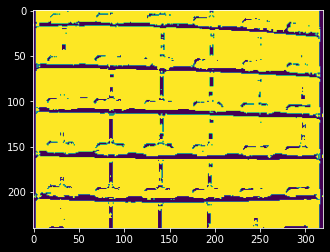

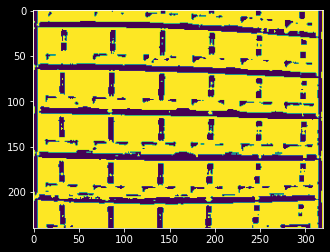

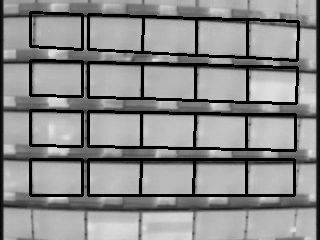

In [14]:
img = cv2.imread('data/video11/frame99.jpg')
intersect_set = np.empty((0,8))
result=solarPanelDetection(img)
cv2.imwrite('detected.jpg',result)
Image('detected.jpg')

In [15]:
print(intersect_set)

[]


[[ 74.  61.  60. ...   0.   0.   0.]
 [ 86.  99.  94. ...   0.   0.   0.]
 [ 95. 119. 119. ...   0.   0.   0.]
 ...
 [105.  95. 102. ...   0.   0.   0.]
 [  0.   0.   0. ...   0.   0.   0.]
 [  0.   0.   0. ...   0.   0.   0.]]
2 4 139.0
3 25 136.0
3 27 139.0
3 28 135.0
3 30 142.0
9 30 142.0
10 29 140.0
10 30 169.0
11 29 166.0
11 30 183.0
12 29 170.0
12 30 186.0
13 29 159.0
13 30 163.0
14 29 147.0
14 30 155.0
15 29 158.0
15 30 155.0
16 29 157.0
16 30 163.0
17 29 163.0
17 30 156.0
18 29 158.0
18 30 161.0
19 29 159.0
19 30 161.0
20 29 160.0
20 30 157.0
21 29 163.0
21 30 161.0
22 29 164.0
22 30 155.0
23 29 161.0
23 30 156.0
24 29 170.0
24 30 158.0
25 29 166.0
25 30 165.0
26 28 139.0
26 29 186.0
26 30 163.0
27 28 152.0
27 29 210.0
27 30 188.0
28 28 165.0
28 29 214.0
28 30 193.0
29 28 152.0
29 29 200.0
29 30 175.0
30 28 151.0
30 29 181.0
30 30 166.0
31 28 138.0
31 29 178.0
31 30 165.0
32 28 139.0
32 29 174.0
32 30 166.0
33 28 145.0
33 29 173.0
33 30 156.0
34 28 146.0
34 29 166.0
34 30 157.0

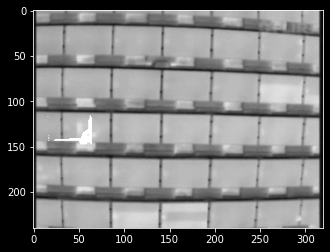

In [16]:
# Implementing water filling algorithm for hot spots detection
import random
img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
measure_val = np.zeros((56,42))
# print(measure_val.shape)
# for i in range(0,54):
#     for j in range(0,39):
#         measure_val[i][j]=0
num_rain_drops = 100*54*39
for k in range(num_rain_drops):
#     print(k)
    doBreak=False
#     print(k)
    x = random.randint(14,67)
    y = random.randint(113,151)
#     print('First: '+ str(x)+' '+str(y))
    x_min=y_min=0
    while doBreak==False:
        min_dif=99999
        n=0
        while(n<=3):
#             print(min_dif)
#             print(x,y,n)
#             print(x+n-14,y+n-113)
            if x>=62 or y>=145:
                break
            dif_n = img_gray[x+n][y+n]+measure_val[x+n-14][y+n-113]-img_gray[x][y]-measure_val[x-14][y-113]
#             print(dif_n)
            if min_dif>dif_n:
                min_dif = dif_n
                x_min = x+n
                y_min = y+n
#                 print(x_min,y_min)
            n+=1
#         print(min_dif)
        if min_dif<0:
            x = x_min
            y = y_min
#             print('Second: '+str(x)+' '+str(y))
#             print(min_dif)
        else:
            measure_val[x-14][y-113]+=1
            doBreak = True
print(measure_val)
plt.figure()
for i in range(measure_val.shape[0]):
    for j in range(measure_val.shape[1]):
        if measure_val[i][j]>=135:
            print(i,j,measure_val[i][j])
            img_gray[j+113][i+14]=255
# img_gray[139][28]=255
plt.imshow(img_gray,cmap='gray')
plt.savefig('test.jpg')
plt.show()

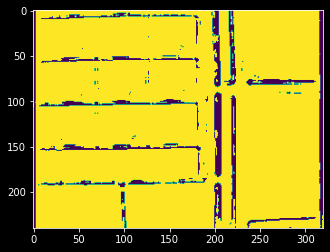

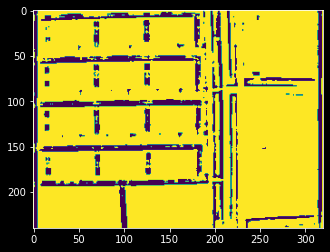

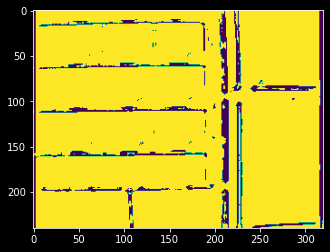

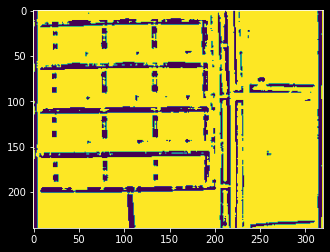

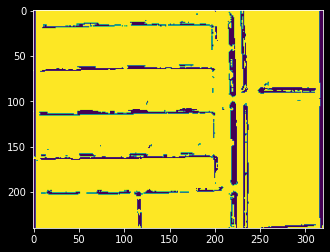

...

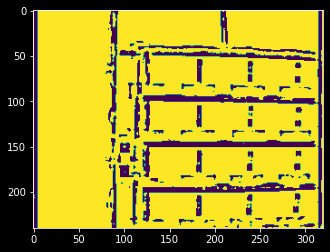

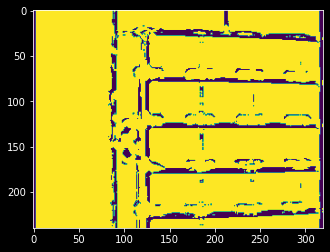

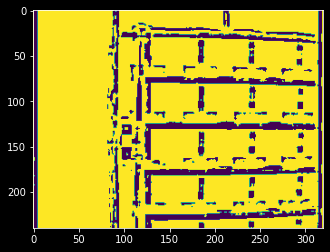

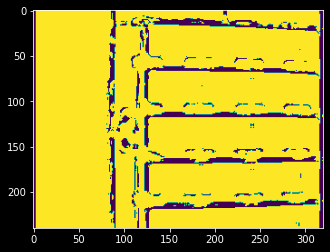

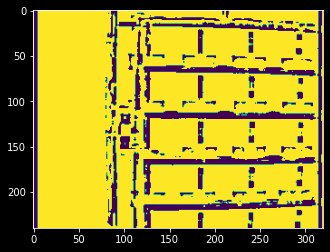

In [19]:
cap = cv2.VideoCapture('data/video11.mp4')
width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH) + 0.5)
height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT) + 0.5)
size = (width, height)
resultVid = cv2.VideoWriter('filename.avi',  
                         cv2.VideoWriter_fourcc(*'MJPG'), 
                         10, size) 
while(cap.isOpened()):
    ret,frame=cap.read()
#     cv2.imshow('Frame',frame)
    if ret==True:
        result = solarPanelDetection(frame)
        cv2.imshow('Result',result)
        resultVid.write(result)
        if cv2.waitKey(25) & 0xFF == ord('q'):
            break
    else:
        break
cap.release()
resultVid.release()
cv2.destroyAllWindows()